In [1]:
import pandas as pd
import numpy as np
from matplotlib import  pyplot as plt
%matplotlib inline

import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('h1n1_features.csv')

In [3]:
data.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [4]:
data.shape

(26707, 36)

In [5]:
labels = pd.read_csv('h1n1_labels.csv')
labels.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0


In [6]:
df = pd.concat([data, labels], axis=1)
df.drop('respondent_id',axis=1, inplace=True)

In [7]:
pd.set_option('display.max_columns', None)
df.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [8]:
df.shape

(26707, 37)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 37 columns):
h1n1_concern                   26615 non-null float64
h1n1_knowledge                 26591 non-null float64
behavioral_antiviral_meds      26636 non-null float64
behavioral_avoidance           26499 non-null float64
behavioral_face_mask           26688 non-null float64
behavioral_wash_hands          26665 non-null float64
behavioral_large_gatherings    26620 non-null float64
behavioral_outside_home        26625 non-null float64
behavioral_touch_face          26579 non-null float64
doctor_recc_h1n1               24547 non-null float64
doctor_recc_seasonal           24547 non-null float64
chronic_med_condition          25736 non-null float64
child_under_6_months           25887 non-null float64
health_worker                  25903 non-null float64
health_insurance               14433 non-null float64
opinion_h1n1_vacc_effective    26316 non-null float64
opinion_h1n1_risk          

In [10]:
df.dtypes.value_counts()

float64    23
object     12
int64       2
dtype: int64

### Missing Values

In [11]:
df.isna().sum()

h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
marital_status                  1408
r

In [12]:
null_sum = df.isnull().sum()
total = null_sum.sort_values(ascending=False)
percent = (((null_sum / len(df))*100).round(2)).sort_values(ascending=False)
#percent = ( ((missing['total'] / len(data)*100).round(2) ).sort_values(ascending=False)
    
# concatenate along the columns 
df_Null = pd.concat([total, percent], axis=1, keys=['Number of NaN', 'Percent NaN'])

In [13]:
df_Null.head(31)

,Number of NaN,Percent NaN
employment_occupation,13470,50.44
employment_industry,13330,49.91
health_insurance,12274,45.96
income_poverty,4423,16.56
doctor_recc_seasonal,2160,8.09
doctor_recc_h1n1,2160,8.09
rent_or_own,2042,7.65
employment_status,1463,5.48
marital_status,1408,5.27
education,1407,5.27


In [14]:
mis_val_columns = df_Null[
            df_Null.iloc[:,1] != 0]

In [15]:
 print ("The dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_columns.shape[0]) +" columns that have missing values.")

The dataframe has 37 columns.
There are 30 columns that have missing values.


In [16]:
#employment_occupation
df['employment_occupation'].value_counts(dropna=False)

NaN         13470
xtkaffoo     1778
mxkfnird     1509
emcorrxb     1270
cmhcxjea     1247
xgwztkwe     1082
hfxkjkmi      766
qxajmpny      548
xqwwgdyp      485
kldqjyjy      469
uqqtjvyb      452
tfqavkke      388
ukymxvdu      372
vlluhbov      354
oijqvulv      344
ccgxvspp      341
bxpfxfdn      331
haliazsg      296
rcertsgn      276
xzmlyyjv      248
dlvbwzss      227
hodpvpew      208
dcjcmpih      148
pvmttkik       98
Name: employment_occupation, dtype: int64

In [17]:
df[['employment_occupation','employment_status','employment_industry']]

,employment_occupation,employment_status,employment_industry
0,NaN,Not in Labor Force,NaN
1,xgwztkwe,Employed,pxcmvdjn
2,xtkaffoo,Employed,rucpziij
3,NaN,Not in Labor Force,NaN
4,emcorrxb,Employed,wxleyezf
...,...,...,...
26702,NaN,Not in Labor Force,NaN
26703,cmhcxjea,Employed,fcxhlnwr
26704,NaN,NaN,NaN
26705,haliazsg,Employed,fcxhlnwr


In [18]:
#table[(table.column_name == some_value) | (table.column_name2 == some_value2)]
df_employ_null = df[(df['employment_occupation'] == np.NaN) | (df['employment_status'] == 'Not in Labor Force')]

In [19]:
pd.set_option('display.max_rows', None)
df_employ_null[['employment_occupation','employment_status','employment_industry','health_insurance']]

,employment_occupation,employment_status,employment_industry,health_insurance
0,NaN,Not in Labor Force,NaN,1.0
3,NaN,Not in Labor Force,NaN,NaN
9,NaN,Not in Labor Force,NaN,1.0
12,NaN,Not in Labor Force,NaN,1.0
14,NaN,Not in Labor Force,NaN,1.0
16,NaN,Not in Labor Force,NaN,1.0
19,NaN,Not in Labor Force,NaN,1.0
20,NaN,Not in Labor Force,NaN,NaN
23,NaN,Not in Labor Force,NaN,0.0
27,NaN,Not in Labor Force,NaN,NaN


In [20]:
len(df_employ_null)

10231

In [21]:
df['employment_occupation'].value_counts(dropna=False)

NaN         13470
xtkaffoo     1778
mxkfnird     1509
emcorrxb     1270
cmhcxjea     1247
xgwztkwe     1082
hfxkjkmi      766
qxajmpny      548
xqwwgdyp      485
kldqjyjy      469
uqqtjvyb      452
tfqavkke      388
ukymxvdu      372
vlluhbov      354
oijqvulv      344
ccgxvspp      341
bxpfxfdn      331
haliazsg      296
rcertsgn      276
xzmlyyjv      248
dlvbwzss      227
hodpvpew      208
dcjcmpih      148
pvmttkik       98
Name: employment_occupation, dtype: int64

In [22]:
#health insurance
#Most of NaNs are not in labor force so probabily don't have health insurance
df['health_insurance'].value_counts(dropna=False)

1.0    12697
NaN    12274
0.0     1736
Name: health_insurance, dtype: int64

In [23]:
df['health_insurance'].fillna(0, inplace=True)

In [24]:
#df_data['health_insurance'].isna().sum()
df['health_insurance'].value_counts(dropna=False)

0.0    14010
1.0    12697
Name: health_insurance, dtype: int64

In [25]:
#health_insurance = done
#employment_occupation / NaN  = 'Not in Labor Force'
#employment_industry / NaN = 'Not in Labor Force'
#health_insurance / NaN = 0
df["employment_occupation"].fillna("Not in Labor Force", inplace = True) 
df["employment_industry"].fillna("Not in Labor Force", inplace = True) 

In [26]:
df[["employment_occupation","employment_industry","health_insurance"]].isna().sum()

employment_occupation    0
employment_industry      0
health_insurance         0
dtype: int64

In [27]:
df["employment_occupation"].value_counts()

Not in Labor Force    13470
xtkaffoo               1778
mxkfnird               1509
emcorrxb               1270
cmhcxjea               1247
xgwztkwe               1082
hfxkjkmi                766
qxajmpny                548
xqwwgdyp                485
kldqjyjy                469
uqqtjvyb                452
tfqavkke                388
ukymxvdu                372
vlluhbov                354
oijqvulv                344
ccgxvspp                341
bxpfxfdn                331
haliazsg                296
rcertsgn                276
xzmlyyjv                248
dlvbwzss                227
hodpvpew                208
dcjcmpih                148
pvmttkik                 98
Name: employment_occupation, dtype: int64

In [28]:
#income poverty
df['income_poverty'].value_counts(dropna=False)

<= $75,000, Above Poverty    12777
> $75,000                     6810
NaN                           4423
Below Poverty                 2697
Name: income_poverty, dtype: int64

In [29]:
income_poverty_null = df[(df['income_poverty'] == np.NaN) | (df['employment_status'] == 'Not in Labor Force')]

In [30]:
income_poverty_null[['income_poverty','employment_status']].head(50)

,income_poverty,employment_status
0,Below Poverty,Not in Labor Force
3,Below Poverty,Not in Labor Force
9,"<= $75,000, Above Poverty",Not in Labor Force
12,"<= $75,000, Above Poverty",Not in Labor Force
14,"<= $75,000, Above Poverty",Not in Labor Force
16,"<= $75,000, Above Poverty",Not in Labor Force
19,"<= $75,000, Above Poverty",Not in Labor Force
20,"<= $75,000, Above Poverty",Not in Labor Force
23,Below Poverty,Not in Labor Force
27,"<= $75,000, Above Poverty",Not in Labor Force


In [31]:
#df_data.iloc[df_data['income_poverty'] == np.NaN]
income_pov_nan = df[df['income_poverty'].isnull()]

In [32]:
income_pov_nan['income_poverty']

24       NaN
26       NaN
31       NaN
38       NaN
39       NaN
54       NaN
57       NaN
63       NaN
64       NaN
68       NaN
75       NaN
78       NaN
84       NaN
90       NaN
91       NaN
94       NaN
104      NaN
105      NaN
111      NaN
115      NaN
154      NaN
158      NaN
162      NaN
170      NaN
175      NaN
183      NaN
189      NaN
198      NaN
203      NaN
205      NaN
225      NaN
226      NaN
227      NaN
232      NaN
235      NaN
237      NaN
243      NaN
269      NaN
272      NaN
273      NaN
276      NaN
283      NaN
284      NaN
286      NaN
295      NaN
300      NaN
310      NaN
316      NaN
317      NaN
328      NaN
353      NaN
356      NaN
379      NaN
396      NaN
401      NaN
406      NaN
409      NaN
410      NaN
417      NaN
421      NaN
427      NaN
429      NaN
441      NaN
451      NaN
452      NaN
468      NaN
471      NaN
486      NaN
493      NaN
497      NaN
502      NaN
505      NaN
519      NaN
531      NaN
545      NaN
555      NaN
557      NaN

In [33]:
df["income_poverty"].fillna("Not in Labor Force", inplace = True) 

In [34]:
df["income_poverty"].isna().sum()

0

In [35]:
df.isna().sum()

h1n1_concern                     92
h1n1_knowledge                  116
behavioral_antiviral_meds        71
behavioral_avoidance            208
behavioral_face_mask             19
behavioral_wash_hands            42
behavioral_large_gatherings      87
behavioral_outside_home          82
behavioral_touch_face           128
doctor_recc_h1n1               2160
doctor_recc_seasonal           2160
chronic_med_condition           971
child_under_6_months            820
health_worker                   804
health_insurance                  0
opinion_h1n1_vacc_effective     391
opinion_h1n1_risk               388
opinion_h1n1_sick_from_vacc     395
opinion_seas_vacc_effective     462
opinion_seas_risk               514
opinion_seas_sick_from_vacc     537
age_group                         0
education                      1407
race                              0
sex                               0
income_poverty                    0
marital_status                 1408
rent_or_own                 

In [36]:
#employment_status
#income_pov_nan = df_data[df_data['income_poverty'].isnull()]
employ_status_nan = df[df['employment_status'].isnull()]
employ_status_nan

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
63,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,18 - 34 Years,12 Years,White,Male,Not in Labor Force,Not Married,NaN,NaN,mlyzmhmf,"MSA, Principle City",3.0,1.0,Not in Labor Force,Not in Labor Force,0,1
64,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,NaN,NaN,45 - 54 Years,NaN,Other or Multiple,Female,Not in Labor Force,NaN,NaN,NaN,kbazzjca,Non-MSA,1.0,2.0,Not in Labor Force,Not in Labor Force,0,0
75,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,4.0,4.0,5.0,4.0,4.0,45 - 54 Years,NaN,White,Male,Not in Labor Force,NaN,NaN,NaN,oxchjgsf,"MSA, Not Principle City",1.0,2.0,Not in Labor Force,Not in Labor Force,1,1
94,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,1.0,35 - 44 Years,NaN,Hispanic,Female,Not in Labor Force,NaN,NaN,NaN,kbazzjca,"MSA, Not Principle City",1.0,3.0,Not in Labor Force,Not in Labor Force,0,0
105,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,5.0,1.0,1.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,oxchjgsf,"MSA, Not Principle City",1.0,1.0,Not in Labor Force,Not in Labor Force,0,0
175,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,1.0,1.0,65+ Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,mlyzmhmf,"MSA, Principle City",1.0,0.0,Not in Labor Force,Not in Labor Force,0,1
183,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,5.0,1.0,2.0,2.0,1.0,NaN,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,lrircsnp,"MSA, Principle City",NaN,NaN,Not in Labor Force,Not in Labor Force,0,0
203,3.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,18 - 34 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,lrircsnp,Non-MSA,0.0,0.0,Not in Labor Force,Not in Labor Force,1,1
205,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,2.0,4.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,bhuqouqj,"MSA, Principle City",NaN,NaN,Not in Labor Force,Not in Labor Force,0,0
269,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,65+ Years,NaN,White,Male,Not in Labor Force,NaN,NaN,NaN,qufhixun,Non-MSA,1.0,0.0,Not in Labor Force,Not in Labor Force,0,0


In [37]:
 df['employment_status'].value_counts(dropna=False)

Employed              13560
Not in Labor Force    10231
NaN                    1463
Unemployed             1453
Name: employment_status, dtype: int64

In [38]:
df["employment_status"].fillna("Not in Labor Force", inplace = True) 

In [39]:
 df['employment_status'].value_counts(dropna=False)

Employed              13560
Not in Labor Force    11694
Unemployed             1453
Name: employment_status, dtype: int64

In [40]:
##rent_or_own
df['rent_or_own'].value_counts(dropna=False, normalize=True).round(3)

Own     0.702
Rent    0.222
NaN     0.076
Name: rent_or_own, dtype: float64

In [41]:
#rent_or_own
#employment_status
rent_own__nan = df[df['rent_or_own'].isnull()]

In [42]:
rent_own__nan

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
16,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,4.0,1.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Married,NaN,Not in Labor Force,oxchjgsf,"MSA, Principle City",0.0,0.0,Not in Labor Force,Not in Labor Force,1,1
26,3.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,4.0,5.0,5.0,4.0,45 - 54 Years,College Graduate,White,Female,Not in Labor Force,Married,NaN,Employed,mlyzmhmf,"MSA, Principle City",1.0,2.0,ldnlellj,hfxkjkmi,1,1
56,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,5.0,2.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,NaN,Employed,oxchjgsf,Non-MSA,0.0,0.0,atmlpfrs,xqwwgdyp,0,1
57,3.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,2.0,4.0,4.0,4.0,1.0,55 - 64 Years,< 12 Years,White,Male,Not in Labor Force,Married,NaN,Employed,kbazzjca,"MSA, Principle City",1.0,0.0,xicduogh,qxajmpny,1,1
63,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,18 - 34 Years,12 Years,White,Male,Not in Labor Force,Not Married,NaN,Not in Labor Force,mlyzmhmf,"MSA, Principle City",3.0,1.0,Not in Labor Force,Not in Labor Force,0,1
64,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,NaN,NaN,45 - 54 Years,NaN,Other or Multiple,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,kbazzjca,Non-MSA,1.0,2.0,Not in Labor Force,Not in Labor Force,0,0
75,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,4.0,4.0,5.0,4.0,4.0,45 - 54 Years,NaN,White,Male,Not in Labor Force,NaN,NaN,Not in Labor Force,oxchjgsf,"MSA, Not Principle City",1.0,2.0,Not in Labor Force,Not in Labor Force,1,1
94,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,1.0,35 - 44 Years,NaN,Hispanic,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,kbazzjca,"MSA, Not Principle City",1.0,3.0,Not in Labor Force,Not in Labor Force,0,0
105,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,5.0,1.0,1.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,oxchjgsf,"MSA, Not Principle City",1.0,1.0,Not in Labor Force,Not in Labor Force,0,0
175,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,1.0,1.0,65+ Years,NaN,White,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,mlyzmhmf,"MSA, Principle City",1.0,0.0,Not in Labor Force,Not in Labor Force,0,1


In [43]:
df["rent_or_own"].fillna("Neither", inplace = True) 

In [44]:
df['rent_or_own'].value_counts(dropna=False, normalize=True).round(3)

Own        0.702
Rent       0.222
Neither    0.076
Name: rent_or_own, dtype: float64

### Encoding Categorical/Object  Variables

In [45]:
#doctor_recc_seasonal
df['doctor_recc_seasonal'].value_counts(dropna=False, normalize=True)

0.0    0.616056
1.0    0.303067
NaN    0.080878
Name: doctor_recc_seasonal, dtype: float64

In [46]:
doc_rec_season_nan = df[df['doctor_recc_seasonal'].isnull()]

In [47]:
doc_rec_season_nan[['doctor_recc_seasonal','health_insurance']]

,doctor_recc_seasonal,health_insurance
2,NaN,0.0
76,NaN,0.0
90,NaN,1.0
94,NaN,0.0
97,NaN,0.0
102,NaN,0.0
149,NaN,0.0
153,NaN,0.0
169,NaN,1.0
180,NaN,0.0


In [48]:
df_1 = df.copy()

In [49]:
df_1.isna().sum()

h1n1_concern                     92
h1n1_knowledge                  116
behavioral_antiviral_meds        71
behavioral_avoidance            208
behavioral_face_mask             19
behavioral_wash_hands            42
behavioral_large_gatherings      87
behavioral_outside_home          82
behavioral_touch_face           128
doctor_recc_h1n1               2160
doctor_recc_seasonal           2160
chronic_med_condition           971
child_under_6_months            820
health_worker                   804
health_insurance                  0
opinion_h1n1_vacc_effective     391
opinion_h1n1_risk               388
opinion_h1n1_sick_from_vacc     395
opinion_seas_vacc_effective     462
opinion_seas_risk               514
opinion_seas_sick_from_vacc     537
age_group                         0
education                      1407
race                              0
sex                               0
income_poverty                    0
marital_status                 1408
rent_or_own                 

In [50]:
df['doctor_recc_seasonal'].fillna(df['doctor_recc_seasonal'].value_counts().index[0],inplace=True)

In [51]:
df.isna().sum()

h1n1_concern                     92
h1n1_knowledge                  116
behavioral_antiviral_meds        71
behavioral_avoidance            208
behavioral_face_mask             19
behavioral_wash_hands            42
behavioral_large_gatherings      87
behavioral_outside_home          82
behavioral_touch_face           128
doctor_recc_h1n1               2160
doctor_recc_seasonal              0
chronic_med_condition           971
child_under_6_months            820
health_worker                   804
health_insurance                  0
opinion_h1n1_vacc_effective     391
opinion_h1n1_risk               388
opinion_h1n1_sick_from_vacc     395
opinion_seas_vacc_effective     462
opinion_seas_risk               514
opinion_seas_sick_from_vacc     537
age_group                         0
education                      1407
race                              0
sex                               0
income_poverty                    0
marital_status                 1408
rent_or_own                 

In [52]:
#df_data = df_data.fillna(df_data['doctor_recc_seasonal'].value_counts().index[0])
df['doctor_recc_h1n1'].value_counts(dropna=False)

0.0    19139
1.0     5408
NaN     2160
Name: doctor_recc_h1n1, dtype: int64

In [53]:
#df_data['doctor_recc_seasonal'].value_counts(dropna=False, normalize=True)

In [54]:
#doctor_recc_h1n1
#df.fillna(df['doctor_recc_h1n1'].value_counts().index[0])
df['doctor_recc_h1n1'].fillna(df['doctor_recc_h1n1'].value_counts().index[0],inplace=True)

In [55]:
df['doctor_recc_h1n1'].value_counts(dropna=False, normalize=True)

0.0    0.797506
1.0    0.202494
Name: doctor_recc_h1n1, dtype: float64

In [56]:
#employment_status
#df_data['employment_status'].value_counts(dropna=False, normalize=True)

In [57]:
#marital_status
#marital_status_nan = df_data[df_data['marital_status'].isnull()]
df['marital_status'].value_counts(dropna=False, normalize=True)

Married        0.507545
Not Married    0.439735
NaN            0.052720
Name: marital_status, dtype: float64

In [58]:
#marital_status_nan.head(10) 
#df.loc[df['column_name'] == some_value]

In [59]:
df["marital_status"].fillna("Neither", inplace = True) 

In [60]:
df['education'].value_counts(dropna=False, normalize=True)

College Graduate    0.378066
Some College        0.263714
12 Years            0.217059
< 12 Years          0.088479
NaN                 0.052683
Name: education, dtype: float64

In [61]:
#df_data['education'].isnull().sum()

In [62]:
#df_data.loc[df_data['education'] == 0.0]

In [63]:
df["education"].replace({np.NaN: "Grad School +"}, inplace=True)

In [64]:
df['education'].value_counts(dropna=False, normalize=True)

College Graduate    0.378066
Some College        0.263714
12 Years            0.217059
< 12 Years          0.088479
Grad School +       0.052683
Name: education, dtype: float64

In [65]:
#chronic_med_condition
df['chronic_med_condition'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.691
1.0    0.273
NaN    0.036
Name: chronic_med_condition, dtype: float64

In [66]:
#df_data.isna().sum()
df['chronic_med_condition'].fillna(df['chronic_med_condition'].value_counts().index[0],inplace=True)

In [67]:
#descr = pd.read_csv(, encoding= 'unicode_escape')

In [68]:
df['child_under_6_months'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.889
1.0    0.080
NaN    0.031
Name: child_under_6_months, dtype: float64

In [69]:
df['child_under_6_months'].fillna(df['child_under_6_months'].value_counts().index[0],inplace=True)

In [70]:
df.isnull().sum()

h1n1_concern                    92
h1n1_knowledge                 116
behavioral_antiviral_meds       71
behavioral_avoidance           208
behavioral_face_mask            19
behavioral_wash_hands           42
behavioral_large_gatherings     87
behavioral_outside_home         82
behavioral_touch_face          128
doctor_recc_h1n1                 0
doctor_recc_seasonal             0
chronic_med_condition            0
child_under_6_months             0
health_worker                  804
health_insurance                 0
opinion_h1n1_vacc_effective    391
opinion_h1n1_risk              388
opinion_h1n1_sick_from_vacc    395
opinion_seas_vacc_effective    462
opinion_seas_risk              514
opinion_seas_sick_from_vacc    537
age_group                        0
education                        0
race                             0
sex                              0
income_poverty                   0
marital_status                   0
rent_or_own                      0
employment_status   

In [71]:
df['health_worker'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.861
1.0    0.109
NaN    0.030
Name: health_worker, dtype: float64

In [72]:
df['health_worker'].fillna(df['health_worker'].value_counts().index[0],inplace=True)

In [73]:
df['household_adults'].value_counts(dropna=False, normalize=True).round(3)

1.0    0.542
0.0    0.302
2.0    0.105
3.0    0.042
NaN    0.009
Name: household_adults, dtype: float64

In [74]:
df["household_adults"].replace({np.NaN: 4.0}, inplace=True)

In [75]:
df['household_children'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.699
1.0    0.119
2.0    0.107
3.0    0.065
NaN    0.009
Name: household_children, dtype: float64

In [76]:
df["household_children"].replace({np.NaN: 4.0}, inplace=True)

In [77]:
#opinion_seas_risk
df['opinion_seas_risk'].value_counts(dropna=False, normalize=True).round(3)

2.0    0.335
4.0    0.286
1.0    0.224
5.0    0.111
3.0    0.025
NaN    0.019
Name: opinion_seas_risk, dtype: float64

In [78]:
df['opinion_seas_risk'].fillna(df['opinion_seas_risk'].value_counts().index[0],inplace=True)

In [79]:
#opinion_seas_sick_from_vacc
df['opinion_seas_sick_from_vacc'].value_counts(dropna=False, normalize=True).round(3)

1.0    0.444
2.0    0.286
4.0    0.182
5.0    0.064
NaN    0.020
3.0    0.004
Name: opinion_seas_sick_from_vacc, dtype: float64

In [80]:
df['opinion_seas_sick_from_vacc'].fillna(df['opinion_seas_sick_from_vacc'].value_counts().index[0],inplace=True)

In [81]:
df.isnull().sum()

h1n1_concern                    92
h1n1_knowledge                 116
behavioral_antiviral_meds       71
behavioral_avoidance           208
behavioral_face_mask            19
behavioral_wash_hands           42
behavioral_large_gatherings     87
behavioral_outside_home         82
behavioral_touch_face          128
doctor_recc_h1n1                 0
doctor_recc_seasonal             0
chronic_med_condition            0
child_under_6_months             0
health_worker                    0
health_insurance                 0
opinion_h1n1_vacc_effective    391
opinion_h1n1_risk              388
opinion_h1n1_sick_from_vacc    395
opinion_seas_vacc_effective    462
opinion_seas_risk                0
opinion_seas_sick_from_vacc      0
age_group                        0
education                        0
race                             0
sex                              0
income_poverty                   0
marital_status                   0
rent_or_own                      0
employment_status   

In [82]:
df.shape

(26707, 37)

In [83]:
df_1 = df.copy()

In [84]:
df_1.dropna(inplace=True)

In [85]:
df_1.shape

(25449, 37)

In [86]:
df_1.isna().sum()

h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_region                 0
census_msa

In [87]:
df_1.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

age_group                 5
education                 5
race                      4
sex                       2
income_poverty            4
marital_status            3
rent_or_own               3
employment_status         3
hhs_geo_region           10
census_msa                3
employment_industry      22
employment_occupation    24
dtype: int64

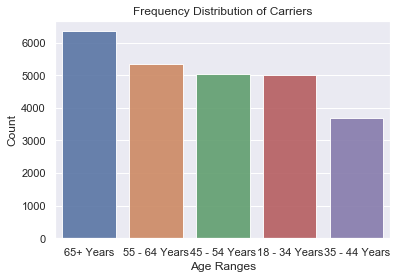

In [88]:
age_grp = df_1['age_group'].value_counts()
sns.set(style="darkgrid")
sns.barplot(age_grp.index, age_grp.values, alpha=0.9)
plt.title('Frequency Distribution of Carriers')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Age Ranges', fontsize=12)
plt.show()

In [89]:
obj_cols = df_1.select_dtypes('object')
obj_cols.head()

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,employment_industry,employment_occupation
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,Not in Labor Force,Not in Labor Force
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",pxcmvdjn,xgwztkwe
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",rucpziij,xtkaffoo
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",Not in Labor Force,Not in Labor Force
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",wxleyezf,emcorrxb


In [90]:
obj_cols.columns

Index(['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation'],
      dtype='object')

In [91]:
obj_feats = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation']
obj_dummies = pd.get_dummies(df_1[obj_feats],drop_first=True)#

In [92]:
obj_dummies.head()

,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [93]:
result_df = pd.concat([df_1,obj_dummies], axis=1)

In [94]:
result_df.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,Not in Labor Force,Not in Labor Force,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.

In [95]:
result_df.isna().sum()

h1n1_concern                            0
h1n1_knowledge                          0
behavioral_antiviral_meds               0
behavioral_avoidance                    0
behavioral_face_mask                    0
behavioral_wash_hands                   0
behavioral_large_gatherings             0
behavioral_outside_home                 0
behavioral_touch_face                   0
doctor_recc_h1n1                        0
doctor_recc_seasonal                    0
chronic_med_condition                   0
child_under_6_months                    0
health_worker                           0
health_insurance                        0
opinion_h1n1_vacc_effective             0
opinion_h1n1_risk                       0
opinion_h1n1_sick_from_vacc             0
opinion_seas_vacc_effective             0
opinion_seas_risk                       0
opinion_seas_sick_from_vacc             0
age_group                               0
education                               0
race                              

In [96]:
cols = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation']
df_dummies = result_df.drop(cols, axis=1) 

In [97]:
df_dummies.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,2.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,4.0,1.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [98]:
df_dummies.shape

(25449, 101)

In [99]:
df_dummies_1 = df_dummies #get rid of .copy df_dummies_1 = df_dummies

In [100]:
#Normalize-normalize all features to a consistent scale of 0 to 1.
X = df_dummies_1.drop('h1n1_vaccine',axis=1).copy() #df_dummies_1.drop('h1n1_vaccine',axis=1).copy()
y = df_dummies_1['h1n1_vaccine']

In [101]:
#Standardization-standard range of units
for col in X.columns:
    # Subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
    X[col] = (X[col] - min(X[col]))/ (max(X[col]) - min(X[col])) 

X.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.5,0.00,0.25,0.25,0.00,0.25,0.00,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.000000,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.75,0.75,0.75,0.25,0.75,0.00,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.333333,0.5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.5,0.00,0.00,0.75,0.00,0.25,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.333333,0.5,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.5,0.50,1.00,1.00,0.75,0.00,0.00,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1

In [102]:
from sklearn.model_selection import train_test_split

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [104]:
pd.Series(y_train).value_counts(normalize=True)

0    0.785572
1    0.214428
Name: h1n1_vaccine, dtype: float64

In [105]:
from sklearn.linear_model import LogisticRegression
#little to no penalty
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
model_log = logreg.fit(X_train, y_train)
model_log

LogisticRegression(C=1000000000000.0, class_weight=None, dual=False,
                   fit_intercept=False, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [106]:
y_hat_test = logreg.predict(X_test)
y_hat_train = logreg.predict(X_train)

In [107]:
import numpy as np
# We could subtract the two columns. If values or equal, difference will be zero. Then count number of zeros 
residuals = np.abs(y_train - y_hat_train)
print(pd.Series(residuals).value_counts())
print(pd.Series(residuals).value_counts(normalize=True))

0    14698
1     2352
Name: h1n1_vaccine, dtype: int64
0    0.862053
1    0.137947
Name: h1n1_vaccine, dtype: float64


In [108]:
residuals = np.abs(y_test - y_hat_test)
print(pd.Series(residuals).value_counts())
print(pd.Series(residuals).value_counts(normalize=True))

0    7282
1    1117
Name: h1n1_vaccine, dtype: int64
0    0.867008
1    0.132992
Name: h1n1_vaccine, dtype: float64


In [109]:
#Standard Scaler
df_dummies_2 = df_dummies.copy()

In [110]:
df_dummies_2.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,2.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,4.0,1.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [111]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler()
X_train_sca = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test_sca = pd.DataFrame(scaler.transform(X_test),columns=X_test.columns, index=X_test.index)

In [112]:
#scaled data between 0 and 1
X_train_sca.describe().round(2).loc[['min','max']]

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [113]:
#max isn't always 1 w/test
X_test_sca.describe().round(2).loc[['min','max']]

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [114]:
# by having large C, it's having small parameter added to equation
#C-1/lmbda. Large C 
#sma;; small data sets liblinear.  'sag' and 'saga' for larger ones.
regr = LogisticRegression(fit_intercept= False, C=1e12, solver='liblinear', max_iter=1000)
regr.fit(X_train_sca, y_train)

y_hat_test = regr.predict(X_test_sca)

In [115]:
#how to judge model's performance
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_hat_test)

0.8670079771401358

In [116]:
#TN FP
#FN TP
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report


In [117]:
cm = confusion_matrix(y_test, y_hat_test)
cm

array([[6269,  361],
       [ 756, 1013]])

In [118]:
#how well were these classes predicted
#Normalize them / divding by sum for each class
#look at first vector. How valid points fr that total class (6269 + 361)
# 756 + 1013 = 
cm[0].sum()

6630

In [119]:
cm.sum(axis=1)

array([6630, 1769])

In [120]:
#of that class how many were actual survivors
cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
cm_norm

array([[0.94555053, 0.05444947],
       [0.42736009, 0.57263991]])

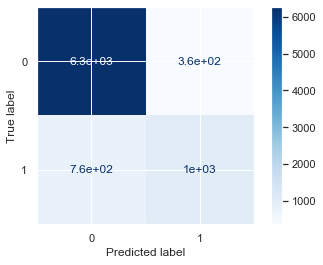

In [121]:
plot_confusion_matrix(regr, X_test, y_test, cmap='Blues')

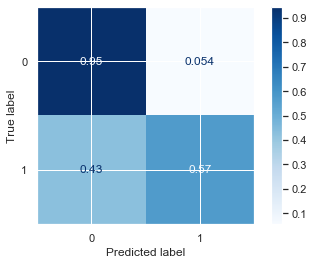

In [122]:
#normalize according to true classes
#for people who didn't get shot, whose true class was 0, it correctly predictd 95%.
#.05 were misclassified
#95% is class accurqcy for people who didn't get shot- class accurcies
#.57 is accuracy for people who got shot - class accuracies
#average of diagnoals, give you accuracy score
plot_confusion_matrix(regr, X_test, y_test, cmap='Blues', normalize='true')

In [123]:
# Here we iterate through the confusion matrix and append labels to our visualization 
def plot_cm(cnf_matrix,thresh=0.5):
    import itertools
    plt.imshow(cnf_matrix,  cmap=plt.cm.Blues) 

    plt.ylabel('True Class')
    plt.xlabel('Predicted Class')
    plt.xticks(ticks=[0,1],labels=['No Shot','Shot'])
    plt.yticks(ticks=[0,1],labels=['No Shot','Shot'])

    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
            plt.text(j, i, cnf_matrix[i, j],
                     horizontalalignment='center',
                     color='white' if cnf_matrix[i, j] > thresh else 'black')
    plt.colorbar()
    
#     acc = accuracy_score(y_test,/.predict(X_test))
#     plt.title(f"Confusion Matrix (overall acc={round(acc,2)})")
    plt.show()

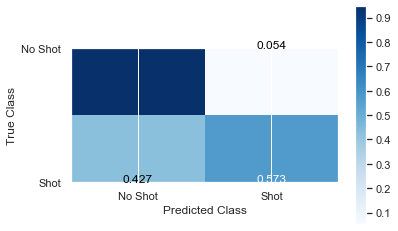

In [124]:
plot_cm(cm_norm.round(3))

In [125]:
#compare not scaled
#unscaled data
regr_1 = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
regr_1.fit(X_train_sca, y_train)
y_hat_test_1 = regr_1.predict(X_test)

0.8670079771401358


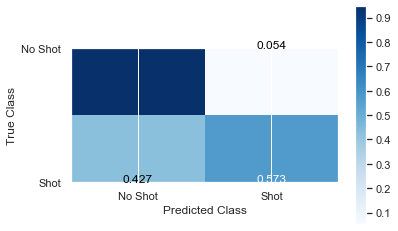

In [126]:
cm_1 = confusion_matrix(y_test, y_hat_test_1)
cm_norm_1 = cm_1 / cm_1.sum(axis=1)[:,np.newaxis]
print(accuracy_score(y_test, y_hat_test_1))
plot_cm(cm_norm_1.round(3))

/Users/davidtorres/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.8698654601738303


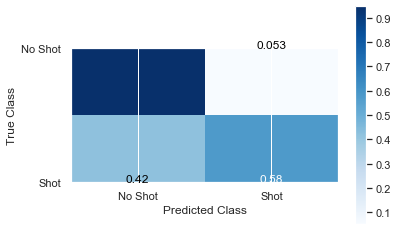

In [127]:
#no regualrization
#default: C=1.0, incude penalty='12'
regr = LogisticRegression()#(fit_intercept=False, C=1e12, solver='liblinear')
regr.fit(X_train_sca, y_train)
y_hat_test = regr.predict(X_test) #going back to scaled data

cm = confusion_matrix(y_test, y_hat_test)
cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
print(accuracy_score(y_test, y_hat_test))
plot_cm(cm_norm.round(3))

### Precision and Recall

In [128]:
#precision-how precise the predcitions are.
#    How many of oyur psotives were actuallytrue. How many of class 1 were actually class 1.
#    how accurate model ws at accuratly predicting true psotive values.
#    true positives / predicted positves
#recall-indicates what percentage of the classes were actaully captured by the model.
from sklearn import metrics
metrics.precision_score(y_test, y_hat_test).round(2)

0.75

In [129]:
#Recall-out of the number of true postives,how many of them did it find
#how good is my model in finding class that I acutlly care about.
# # of true positves / # of actual total postives
metrics.recall_score(y_test,y_hat_test)

0.5799886941775014

### F1 Score

In [130]:
#harminic mean of precision and recall
#best for overall quality of data b/c F1_score can't be high unless both precision snd recall are also high.  Most informative about overall model quality.
#When F1 score is high you knw model is doing well all around. But difficult to express to non-tech audience.
#Don't use in presentation
metrics.f1_score(y_test, y_hat_test)

0.652464228934817

### Classification Report

In [131]:
#support-how many observations there were for each group
#weighted - # precision * # of observations


from sklearn.metrics import classification_report
print(classification_report(y_test,y_hat_test))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      6630
           1       0.75      0.58      0.65      1769

    accuracy                           0.87      8399
   macro avg       0.82      0.76      0.79      8399
weighted avg       0.86      0.87      0.86      8399

